## Semantic Segmentation
어떤 이미지가 있을 때, 이미지의 픽셀마다 분류를 하는 문제이다.<br>
<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
<br>
-> 자율주행에 많이 사용된다.<br>
<br>
<br>
<div>
    <img src=attachment:image-2.png width=800>
</div>
<br>
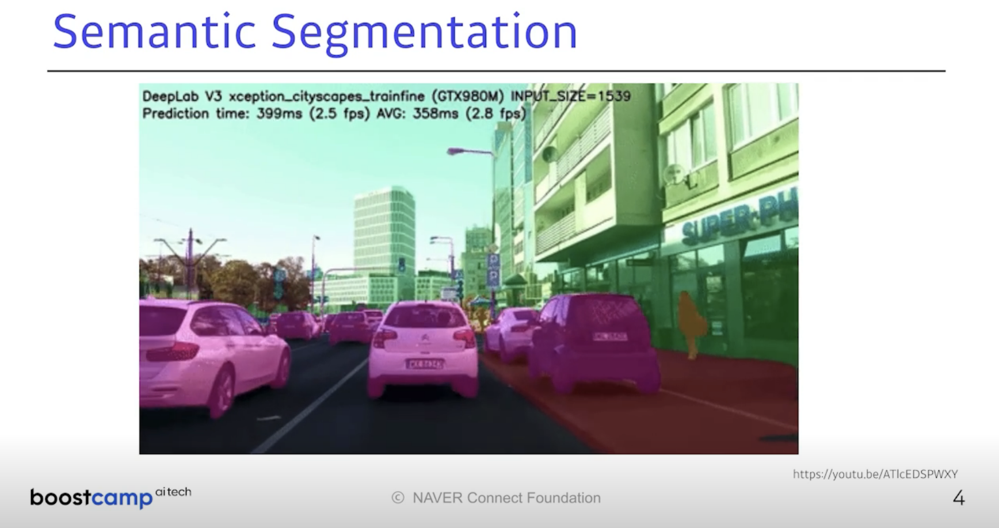
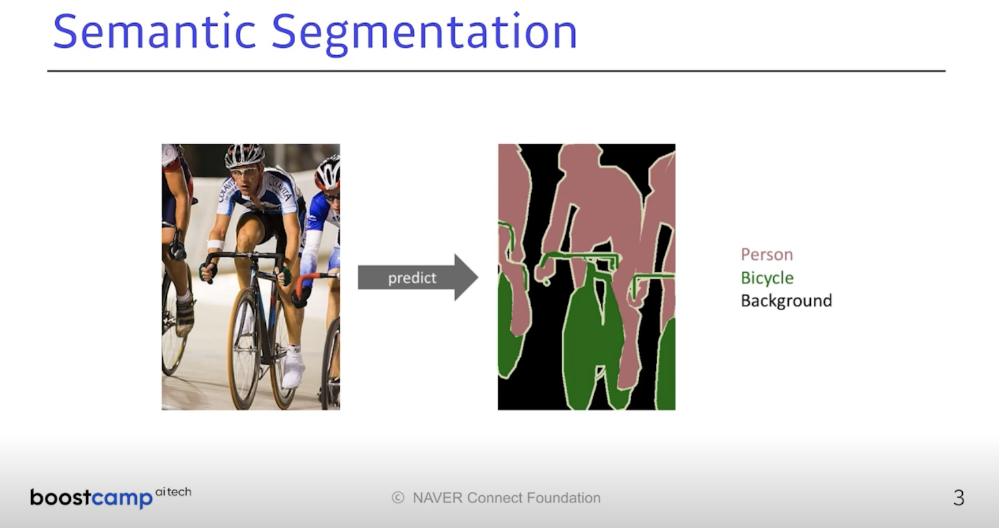

### Fully Convolutional Network
Fully Convolutional Network는 Dense Layer를 없애고 싶은 것에서 출발. 그래서 Dense layer를 없애는 대신 conv연산을 넣었다.<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
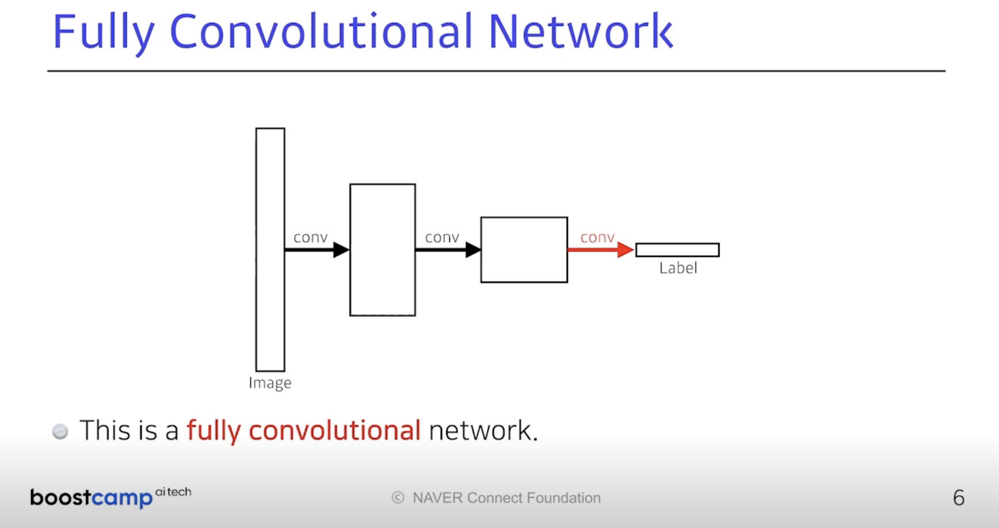

#### Convolutionalization
: Dense레이어를 없애는 과정을 의미.<br>
비교해보면, Dense Layer가 있을 때와 파라미터 개수는 정확히 일치한다. 그냥 Dense Layer가 없어졌을 뿐이다.<br>
이것을 Convolutionalization라고 한다.<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
<br>
이걸 왜 할까? 특히, Semantic Segmentation 관점에서 -> Dense Layer를 없앵고, Fully COnvolutional Network가 되면, 주어진 이미지를 히트맵 형태로 구분할 수 있게된다.<br>
예를 들어, 개, 고양이 사진이 있을 때, 고양이를 히트맵 형태로 구분할 수 있게된다.<br>
즉, 예전엔 이미지를 분류하는데만 사용했는데, 이미지를 통해 semantic segmentation(주어진 이미지 내부에서 픽셀마다 분류)을 할 수 있는 가능성이 생김.<br>
<br>
<div>
    <img src=attachment:image-2.png width=800>
</div>
<br>
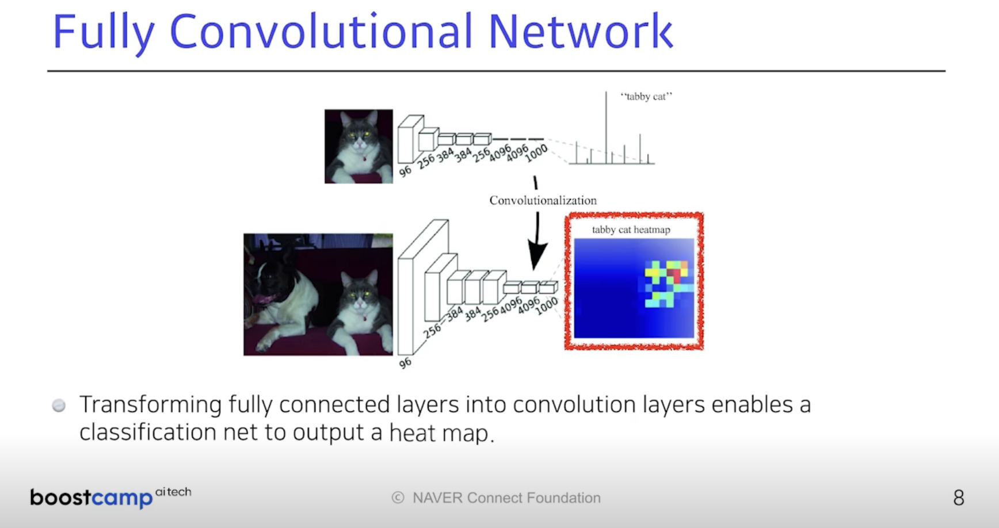
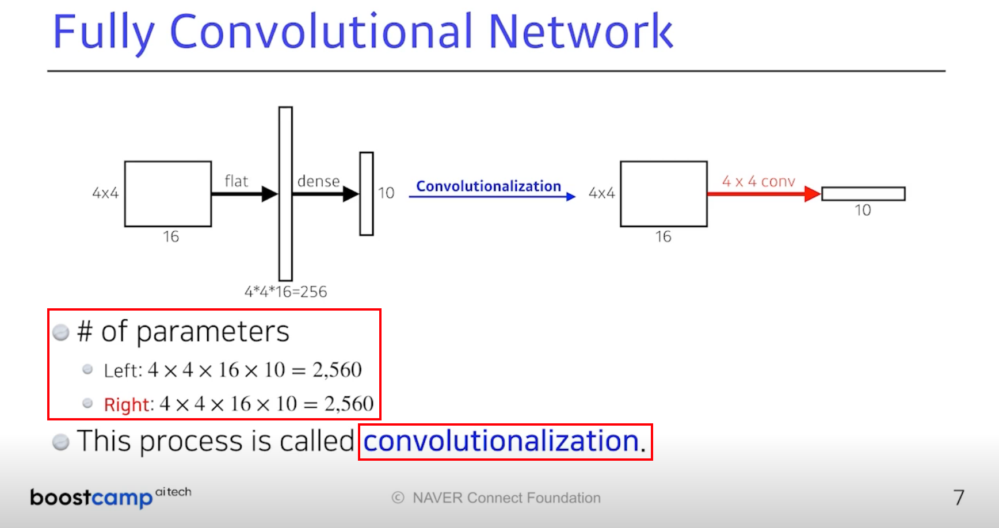

### Deconvolution
직관적으로는 Convolution의 역연산.<br>
엄밀한 의미의 역연산은 아니다. Convolution에서 5x5를 2x2로 만들었다면,<br>
Deconvolution은 2x2를 펼치고 패딩을 많이 줘서, 5x5를 억지로 만드는것 뿐이다.<br>
하지만 파라미터 개수를 계산하거나 할때는 그냥 Convolution의 역연산이라고 생각하면 계산이 편하다.<br>
<br>
1) Convolution과 Deconvolution은 같은 파라미터 개수가 쓰인다.<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
2) Convolution연산과 Deconvolution 연산의 시각화<br>
Convolution: 5x5 -> 2x2, Deconvolution: 2x2 -> 5x5<br>
Deconvolution 연산에선 2x2를 펼치고 패딩을 많이 줘서, 5x5를 억지로 만드는것 뿐이다.<br>
<br>
<div>
    <img src=attachment:image-2.png width=800>
</div>
<br>
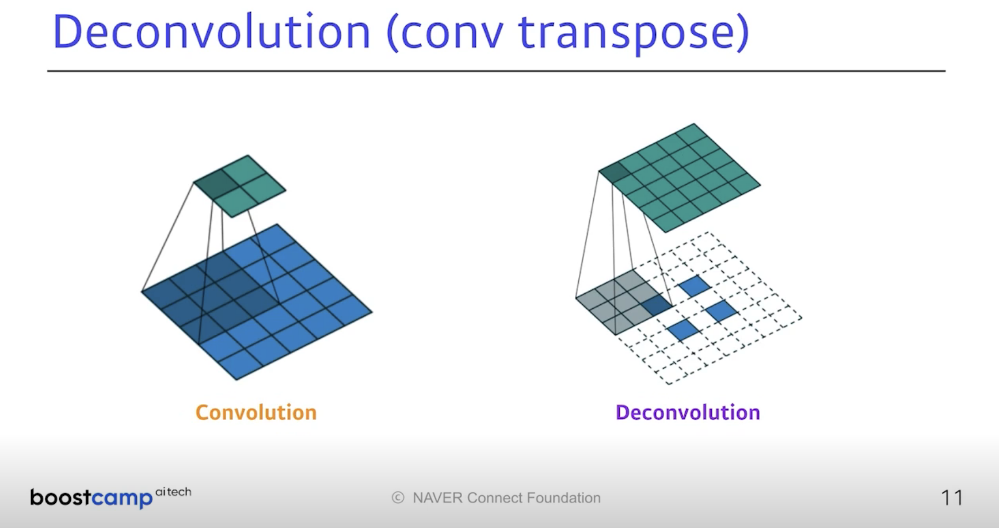
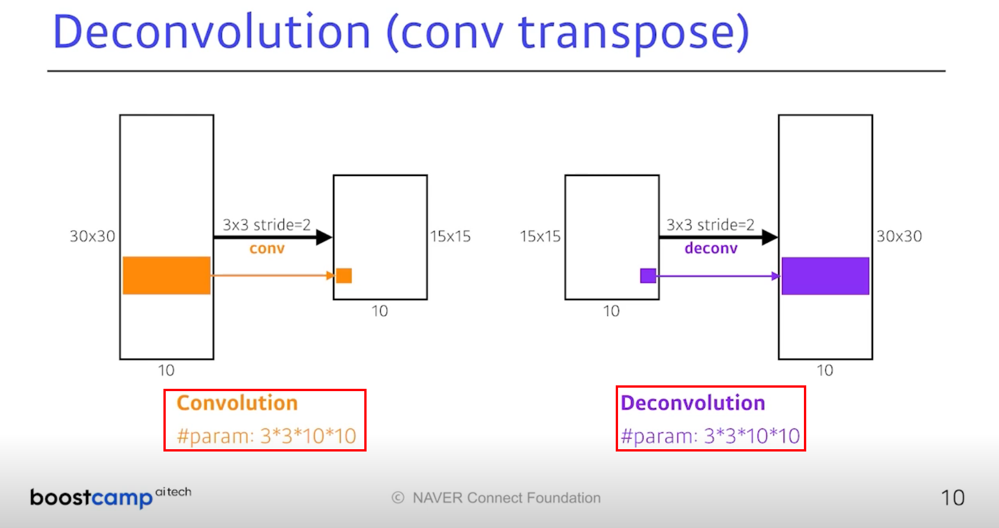

#### Results
FCN결과는 2번째에 있다.<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
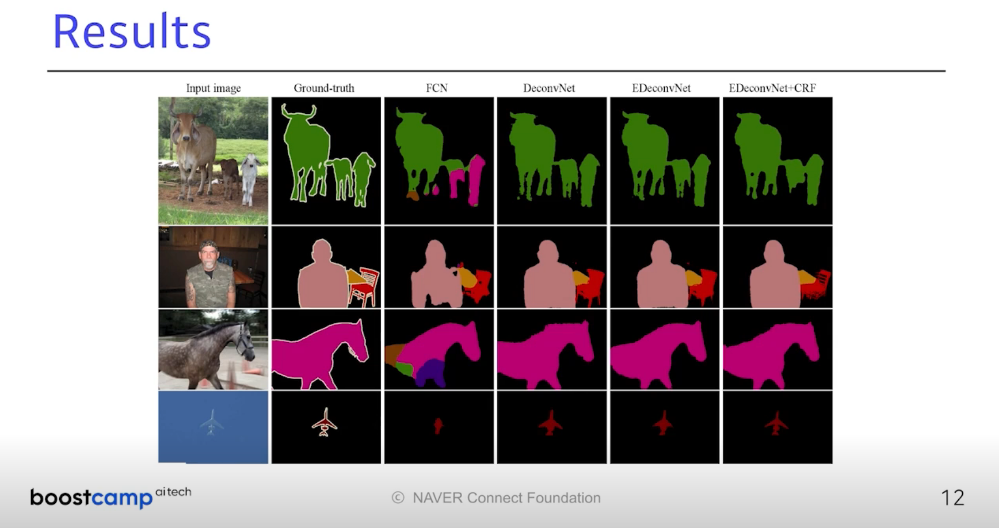

## Detection
이미지 내부에서 픽셀별로 분류를 하는게 아니라, Bounding Box로 분류를 하는 것

### R-CNN
이걸 할 수 있는 가장 간단한 방법.<br>
이미지안에서 바운딩 박스 여러개 뽑고(Selective search로 약 2000region 검색), 리전에 대한 피처를 CNN(AlexNet)을 통해 얻고, SVM가지고 분류<br>
Selective search할 때마다 CNN(AlexNet)을 돌려야 한다.(2000번 돌려야된다.) -> 비효율적이다.<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
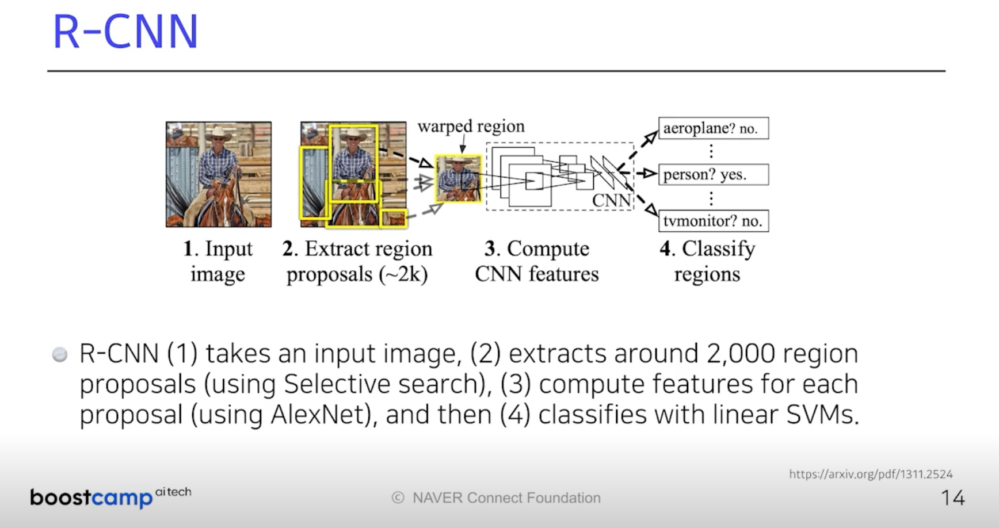

### SPPNet
R-CNN의 가장 큰 문제는 1개의 이미지에서 바운딩 박스를 2000개 뽑는다 하면, 2000개 이미지를 다 CNN 돌려야된다.<br>
SPPNet은 1개의 이미지에 대해 CNN을 1번만 돌리자는게 핵심. 1번 돌려서 얻어지는 feature map 위에서 텐서를 가져와서 그걸 분류에 사용<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
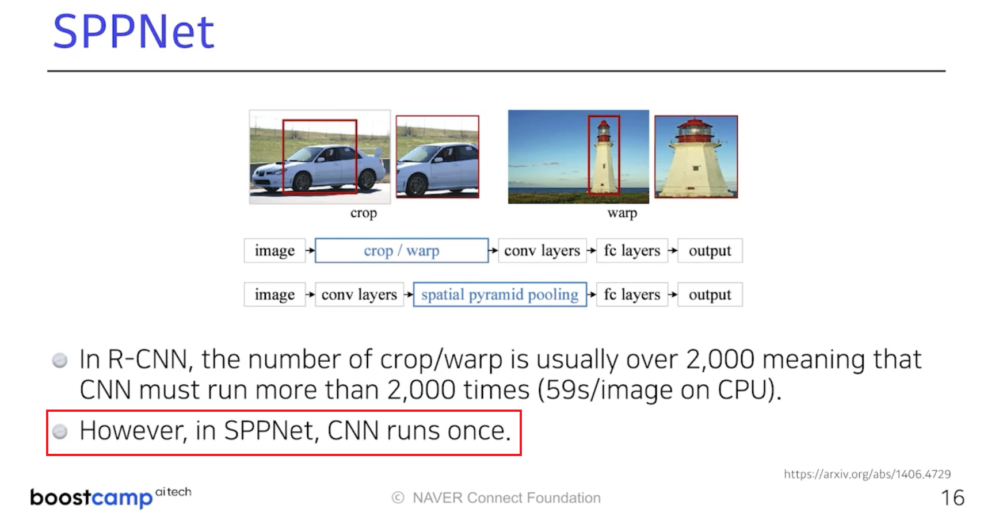

### Fast R-CNN
SPPNet과 동일한 컨셉. Selective Search로 바운딩 박스 세트 얻고, 이미지를 CNN 1번만 돌려서 feature map 생성. 각 바운딩 박스별로 ROI 풀링하고, 마지막에 뉴럴네트워크를 통해서 bounding-box regression 즉, 바운딩 박스에 대한 라벨 분류.<br>
SPPNet과 다른 핵심은, 마지막에 ROI 풀링하고, 뉴럴네트워크로 분류했다 정도.<br>

<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
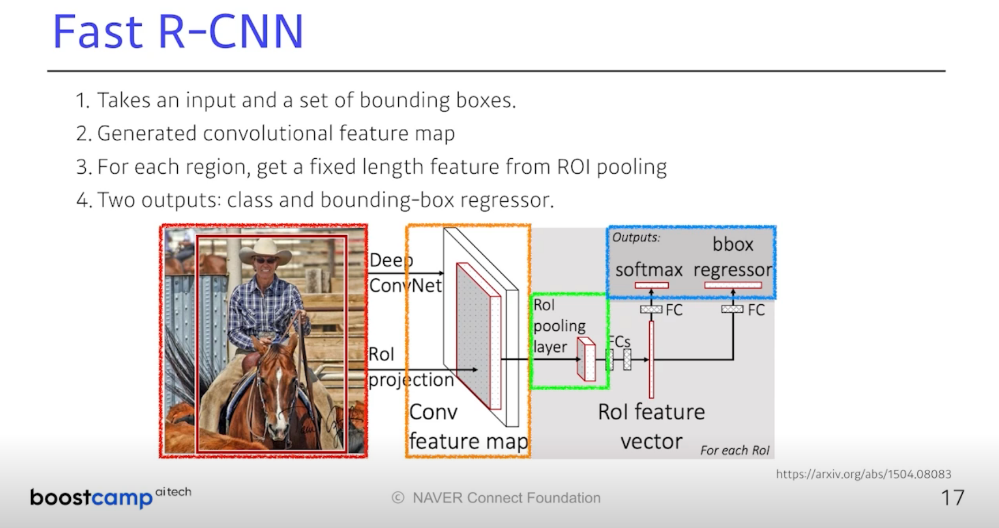

### Faster R-CNN
핵심 bounding box를 찾는것도 Selective Search를 이용할게 아니라, 네트워크로 학습하자해서, Region Proposal Network를 만든것.<br>
그게 RPN(Region Proposal Network)<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
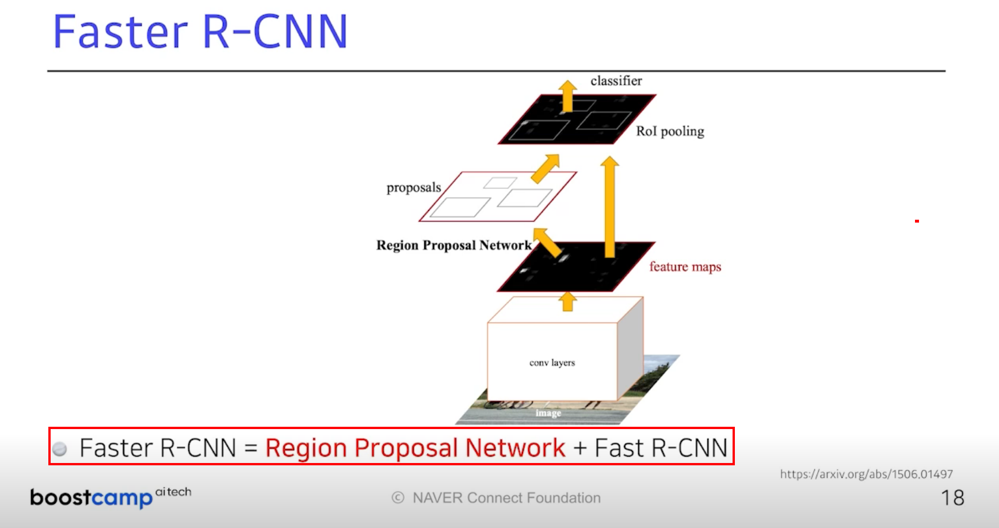

#### RPN(Region Proposal Network)
RPN의 역할은 이미지에서 특정 영역이 바운딩 박스로서의 의미가 있는지 아닌지,즉, 이 안에 분류된 물체가 있을것 같은지 아닌지를 찾아주는 것.<br>
이 물체가 뭔지는 뒷단의 네트워크에게 맡기고, RPN은 순수하게 해당 영역안에 물체가 있을것 같은지만 확인.<br>
이때, 핵심적인 역할을 하는게 Anchor Box이다.<br>

    Anchor boxes: 미리 정해놓은 바운딩 박스의 크기.<br>
<br>
<div>
    <img src=attachment:image-2.png width=800>
</div>
<br>
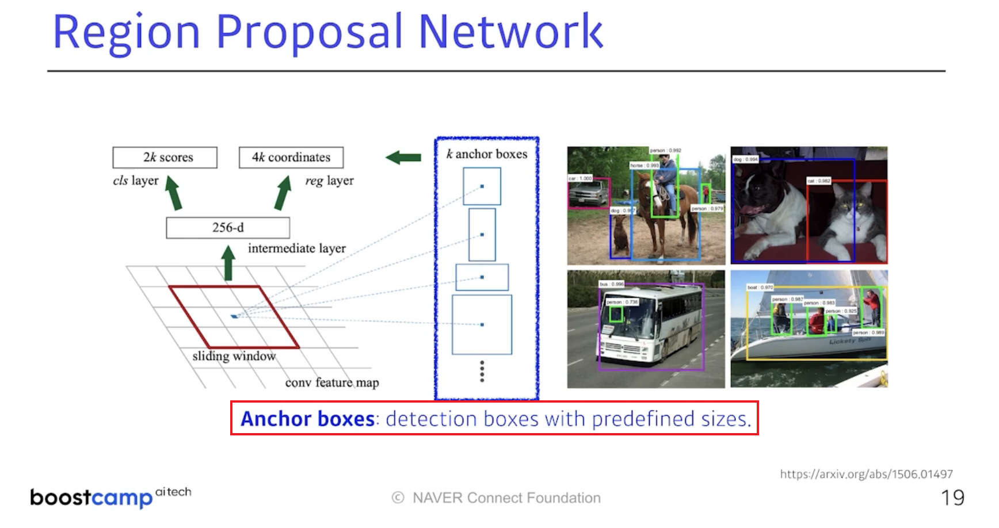

#### RPN 예시
* 9: 앙코 박스의 타입 (사이즈:128,256,512 x 비율 1:1, 1:2, 2:1 => 총 9가지)
* 4: 앙코박스 width 늘릴지, 줄일지, height 늘릴지, 줄일지 4개 파라미터
* 2: 해당 바운딩 박스가 쓸모 있는지, 아닌지 2개 파라미터
> 총 54개 파라미터가 쓰인다.<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>
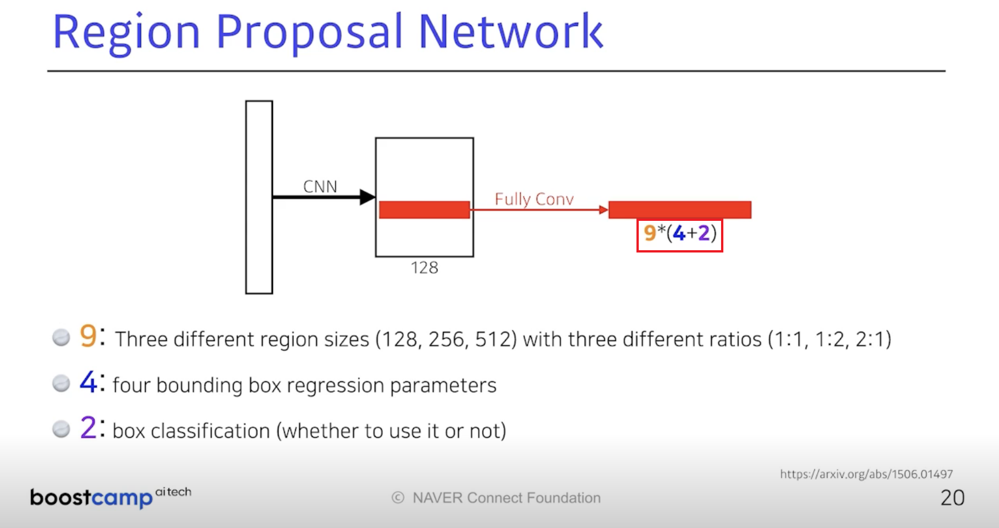

### YOLO (You Only Look Once)
Faster R-CNN보다 훨씬 빠르다. <br>
그 이유는, 이미지 한장에 대해 바운딩 박스마다 막 조사하는게 아니라, 이미지 한장에서 바로 땅 찍어서 나올 수 있기 때문이다.<br>
그래서 You Only Look Once라는 이름을 붙임.<br>
핵심은 바운딩 박스를 따로 뽑는(샘플링하는) 단계가 없다 (No explicit bounding box sampling)<br>
<br>
<div>
    <img src=attachment:image.png width=800>
</div>
<br>

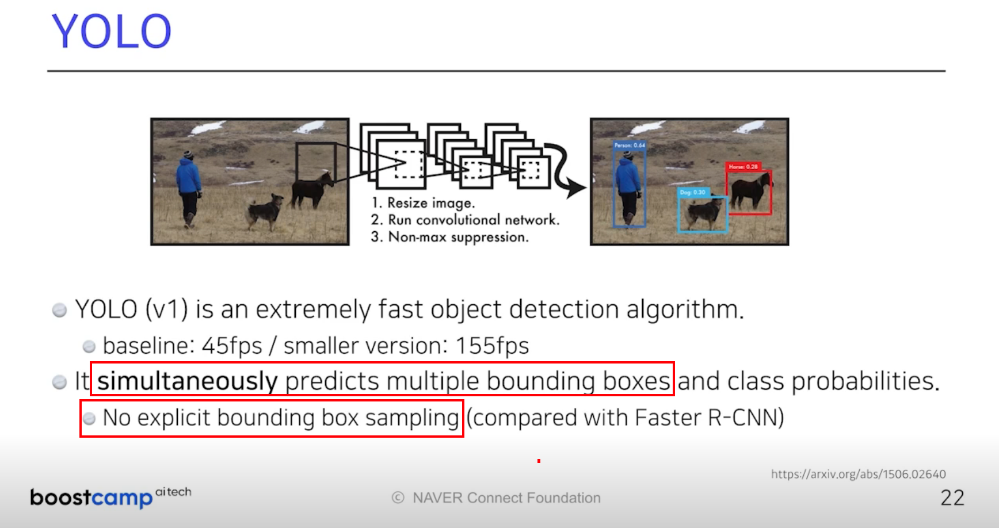

#### YOLO 동작원리
이미지가 들어오면, SxS grid로 나눈다.<br>
그래서, 이미지 안에 바운딩 박스가 5개있다고 가정하고, SxS 그리드안에서 박스와, 분류를 동시에 진행한다.<br>
그래서 텐서의 관점에서 보면"SxS 그리드가 사용되고 x 5개의 바운딩 박스(B*5)에 분류되는 클래스 C개가 더해진값"이 사용된다.<br>
즉, SxS(B*5+C)개의 채널을 갖는 텐서를 만드는게 욜로다.<br>
<br>
<div>
    <img src=attachment:image-2.png width=800>
</div>
<br>
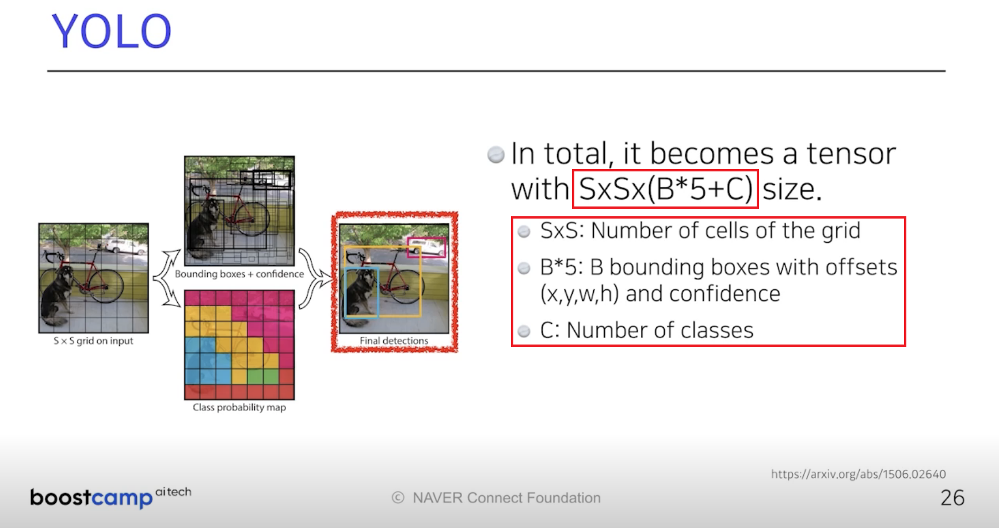

## Summary
1. Semantic Segmentation: 이미지를 픽셀마다 분류하는 문제<br>
-> FCN을 사용한 방법<br>
2. Detection: 이미지에서 바운딩 박스별로 분류하는 문제<br>
-> 바운딩 박스를 분류하기 위해 성능을 높혀가는 방향성